In [1]:
import pandas as pd
from py2neo import Graph, Node, Relationship
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('yelp_business.csv')
df = df.drop(["address", "neighborhood", "postal_code", "latitude", "longitude"], axis=1)
df.to_csv('updated_yelp_business.csv', index=False)

In [2]:
df.head()

,business_id,name,city,state,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",Ahwatukee,AZ,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",McMurray,PA,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",Phoenix,AZ,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",Tempe,AZ,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",Cuyahoga Falls,OH,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


# Create a connection to the Neo4j database

In [6]:
graph_name = "neo4j" 
SERVER_ADDRESS = "bolt://localhost:7687"
SERVER_AUTH = ("neo4j", "root@420")
graph = Graph(SERVER_ADDRESS, auth=SERVER_AUTH)

# Create node, relationships and upload value from business.csv

In [4]:
# Create a set to keep track of unique city names and category names
unique_cities = set()
unique_categories = set()

# Iterate over each row of the DataFrame and create nodes and relationships
for index, row in df.iterrows():
    # Create a "business" node with properties
    business = Node("Business", id=row['business_id'], name=row['name'], stars=row['stars'], review_count=row['review_count'], is_open=row['is_open'], state=row['state'])

    # Check if a "City" node with the same name already exists in the graph
    city_name = row['city']
    city_node = graph.nodes.match("City", name=city_name).first()
    if city_node:
        # If a matching node exists, use it instead of creating a new one
        city = city_node
    else:
        # If a matching node doesn't exist, create a new "City" node
        city = Node("City", name=city_name)
        unique_cities.add(city_name)
        
        # Check if a "State" node with the same name already exists in the graph
        state_name = row['state']
        state_node = graph.nodes.match("State", name=state_name).first()
        if state_node:
            # If a matching node exists, use it instead of creating a new one
            state = state_node
        else:
            # If a matching node doesn't exist, create a new "State" node
            state = Node("State", name=state_name)

        # Create an "in_state" relationship between the "city" and "state" nodes
        in_state = Relationship(city, "in_state", state)

        # Add the nodes and relationship to the graph database
        graph.create(state)
        graph.create(in_state)

    # Create an "is_in_city" relationship between the "business" and "city" nodes
    is_in_city = Relationship(business, "is_in_city", city)
    
    

    # Create "Category" nodes for each category associated with the business
    for category_name in row['categories'].replace("; ", ";").split(";"):
        # Check if a "Category" node with the same name already exists in the graph
        category_node = graph.nodes.match("Category", name=category_name).first()
        if category_node:
            # If a matching node exists, use it instead of creating a new one
            category = category_node
        else:
            # If a matching node doesn't exist, create a new "Category" node
            category = Node("Category", name=category_name)
            unique_categories.add(category_name)

        # Create an "in_category" relationship between the "business" and "category" nodes
        in_category = Relationship(business, "in_category", category)

        # Add the nodes and relationship to the graph database
        graph.create(category)
        graph.create(in_category)

    # Add the nodes and relationship to the graph database
    graph.create(business)
    graph.create(is_in_city)

# Create "City" nodes for each unique city name
for city_name in unique_cities:
    city = Node("City", name=city_name)
    graph.create(city)

# Create "Category" nodes for each unique category name
for category_name in unique_categories:
    category = Node("Category", name=category_name)
    graph.create(category)
    
print("Graph Created")


TransientError: [General.DatabaseUnavailable] The database is not currently available to serve your request, refer to the database logs for more details. Retrying your request at a later time may succeed.

# Top 5 most popular Business Categories

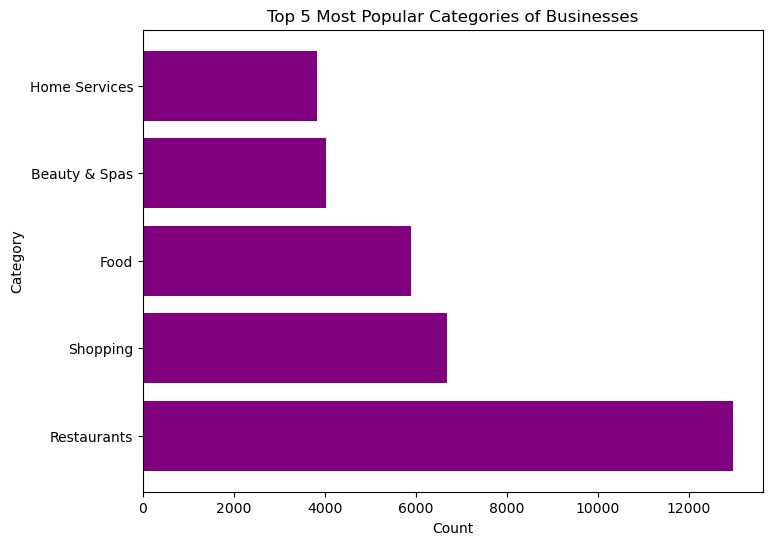

In [7]:
query = """
MATCH (b:Business)-[:in_category]->(c:Category)
RETURN c.name AS category, COUNT(b) AS count
ORDER BY count DESC
LIMIT 5
"""
result = graph.run(query).data()

# Create a horizontal bar chart showing the top 5 most popular categories of businesses
categories = [row['category'] for row in result]
counts = [row['count'] for row in result]
plt.figure(figsize=(8, 6))
plt.barh(categories, counts, color="purple")
plt.title("Top 5 Most Popular Categories of Businesses")
plt.xlabel("Count")
plt.ylabel("Category")
plt.show()


# Top 5 Categories wrt each City

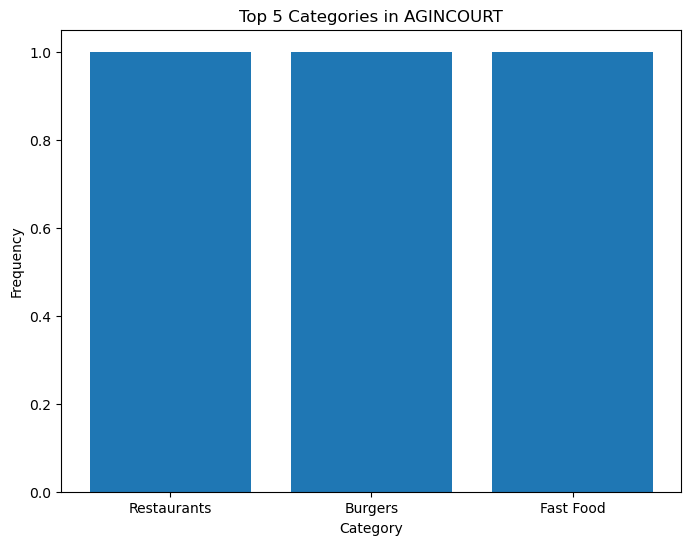

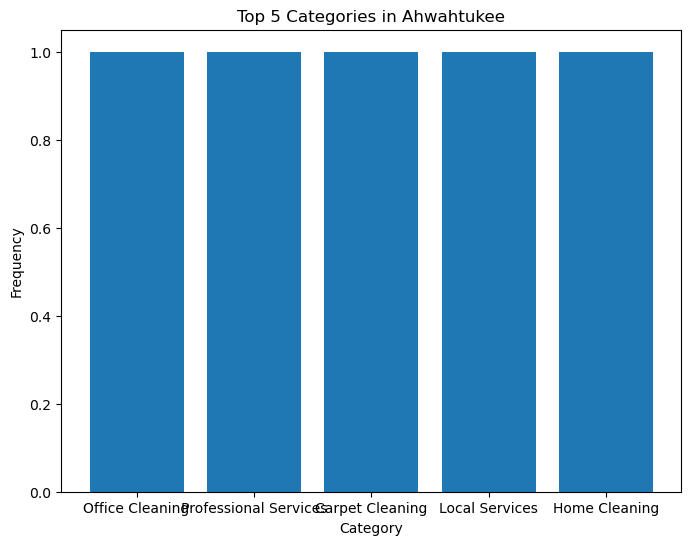

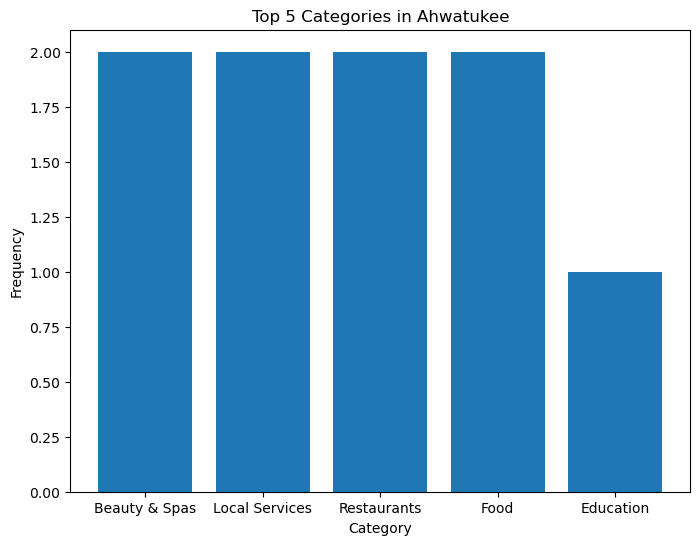

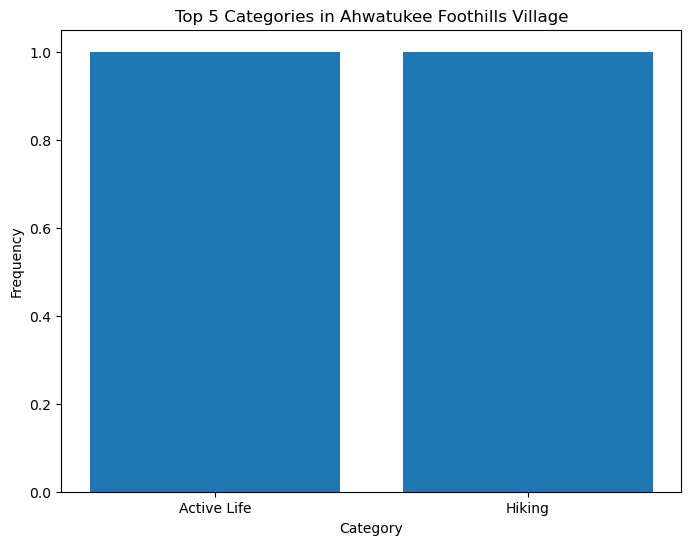

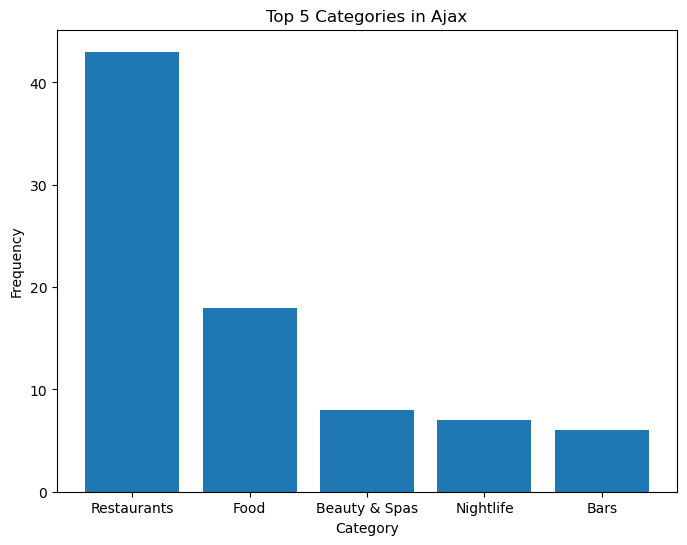

...

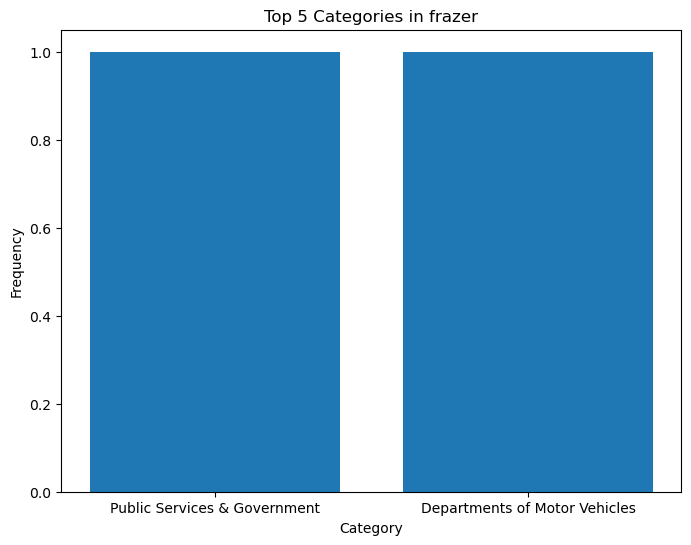

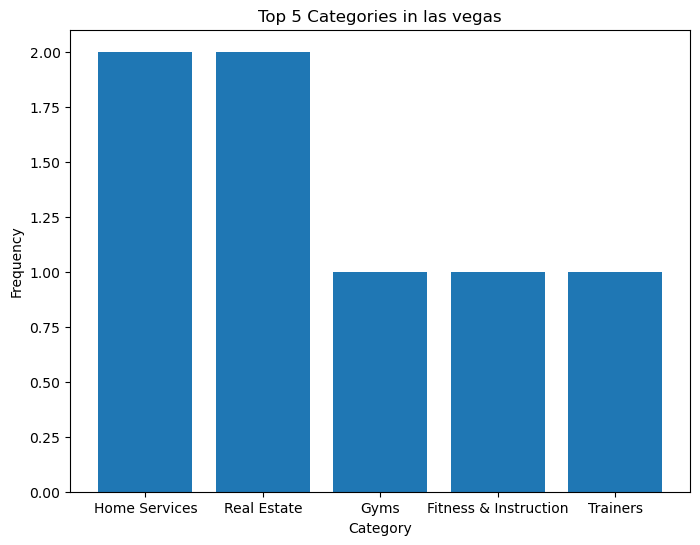

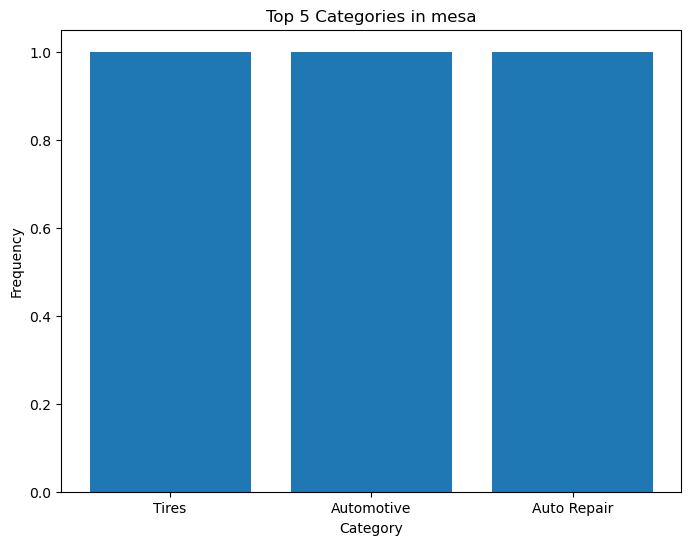

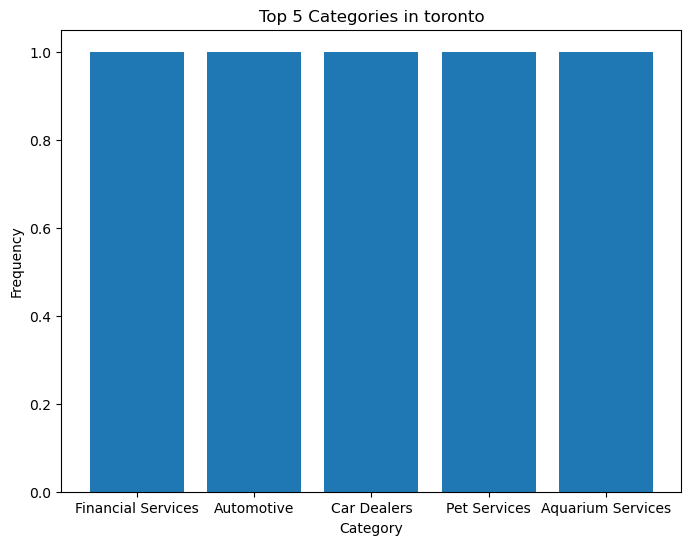

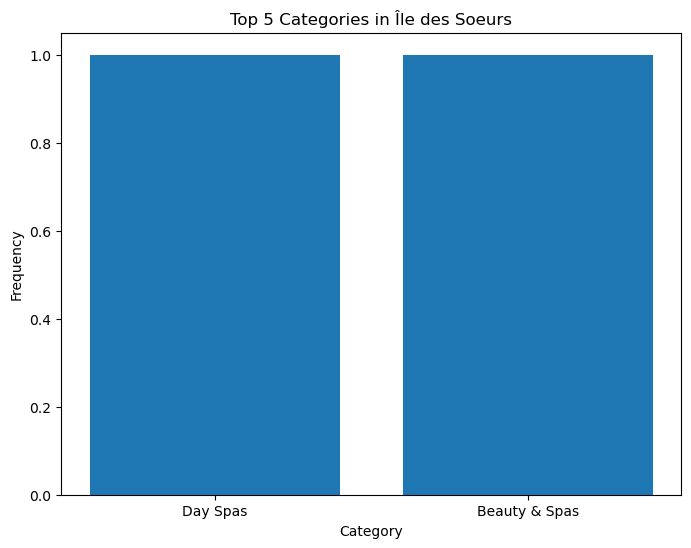

In [20]:
query = """
MATCH (b:Business)-[:is_in_city]->(c:City)
MATCH (b)-[:in_category]->(cat:Category)
RETURN c.name AS city, cat.name AS category, count(b) AS frequency
ORDER BY c.name, frequency DESC
"""
result = graph.run(query).data()

# Create a dictionary to store the categories and their frequencies for each city
categories_by_city = {}
for row in result:
    city = row['city']
    category = row['category']
    frequency = row['frequency']
    if city not in categories_by_city:
        categories_by_city[city] = {}
    categories_by_city[city][category] = frequency

# Create a bar chart showing the top 5 categories in each city
for city, categories in categories_by_city.items():
    top_categories = sorted(categories.items(), key=lambda x: x[1], reverse=True)[:5]
    plt.figure(figsize=(8, 6))
    plt.bar([c[0] for c in top_categories], [c[1] for c in top_categories])
    plt.title(f"Top 5 Categories in {city}")
    plt.xlabel("Category")
    plt.ylabel("Frequency")
    plt.show()

# Top 5 Categories wrt each State

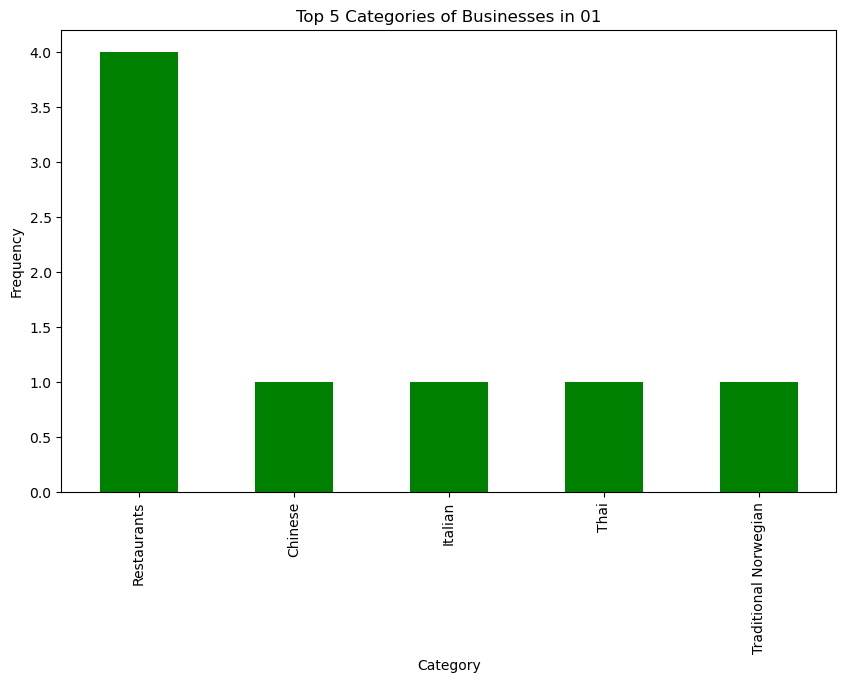

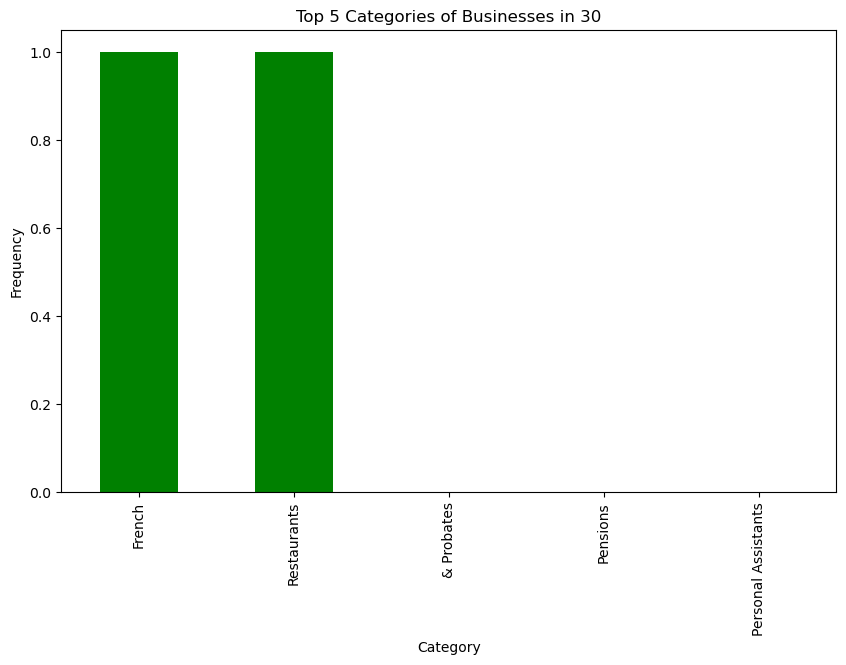

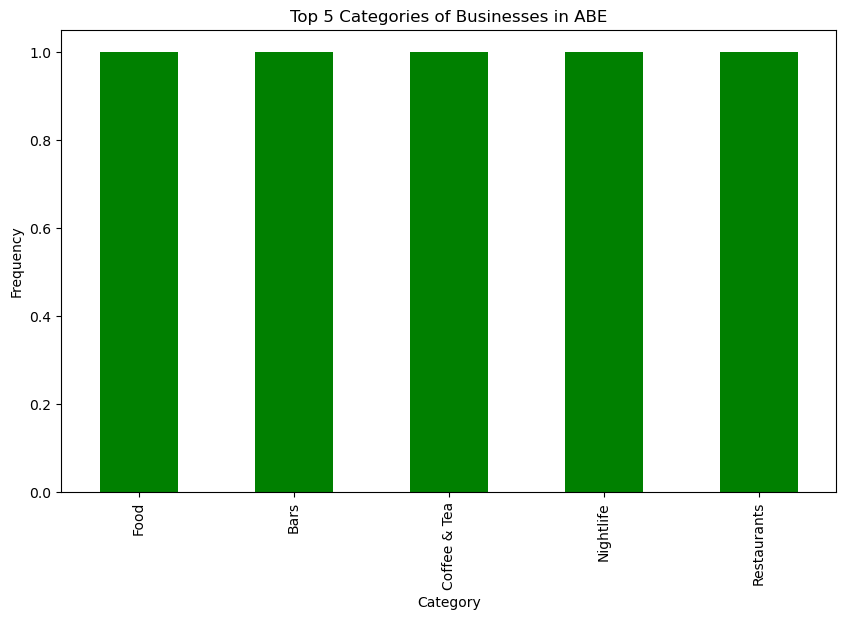

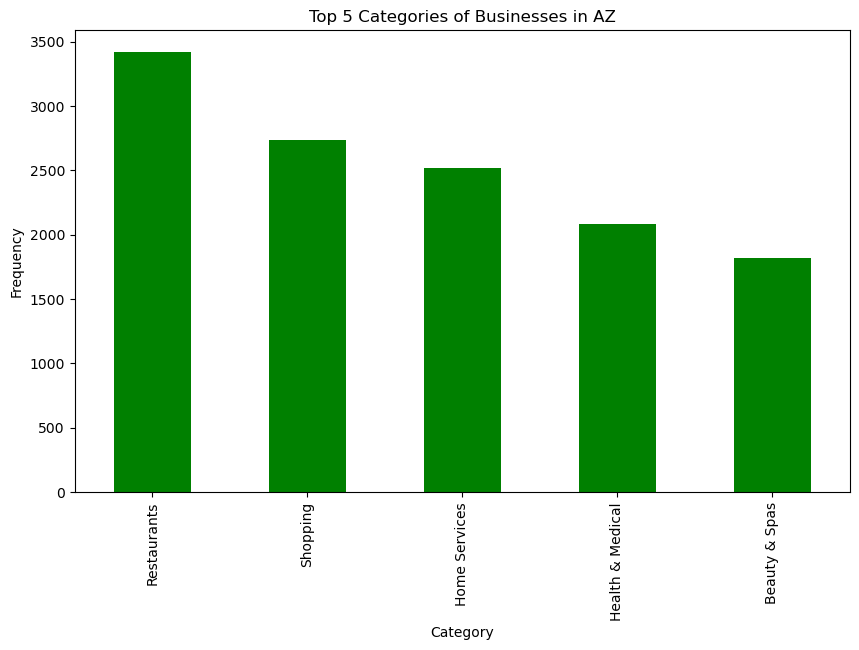

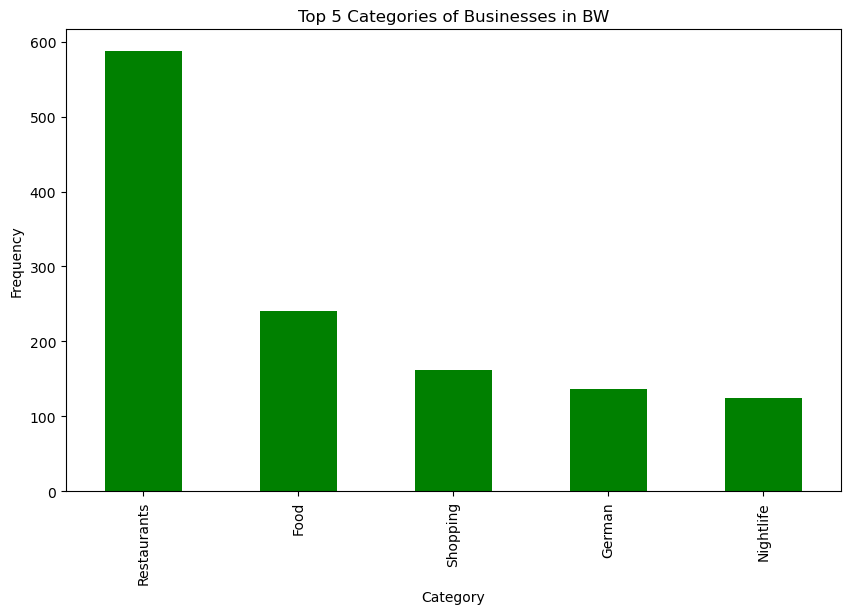

...

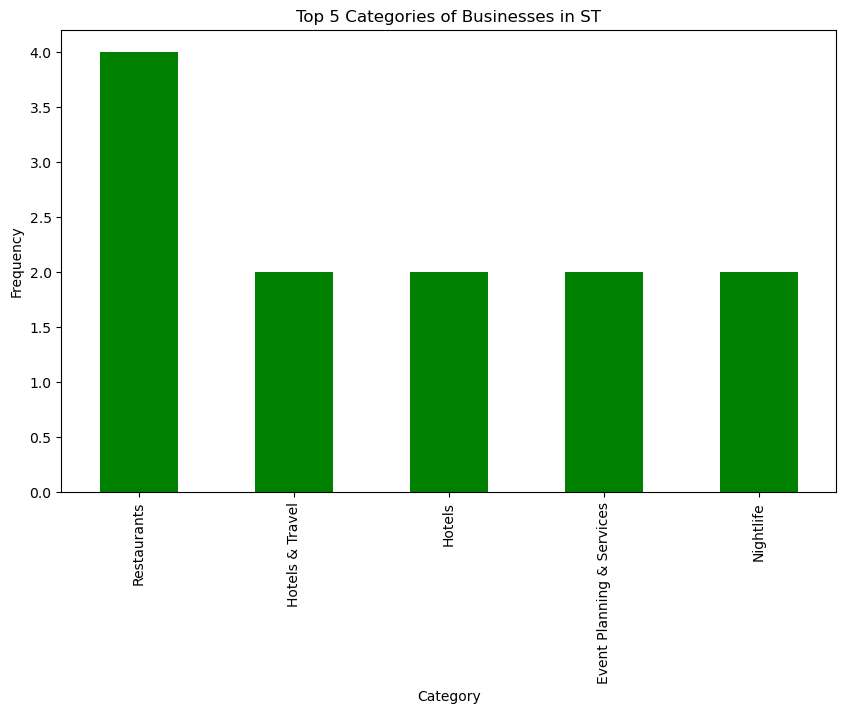

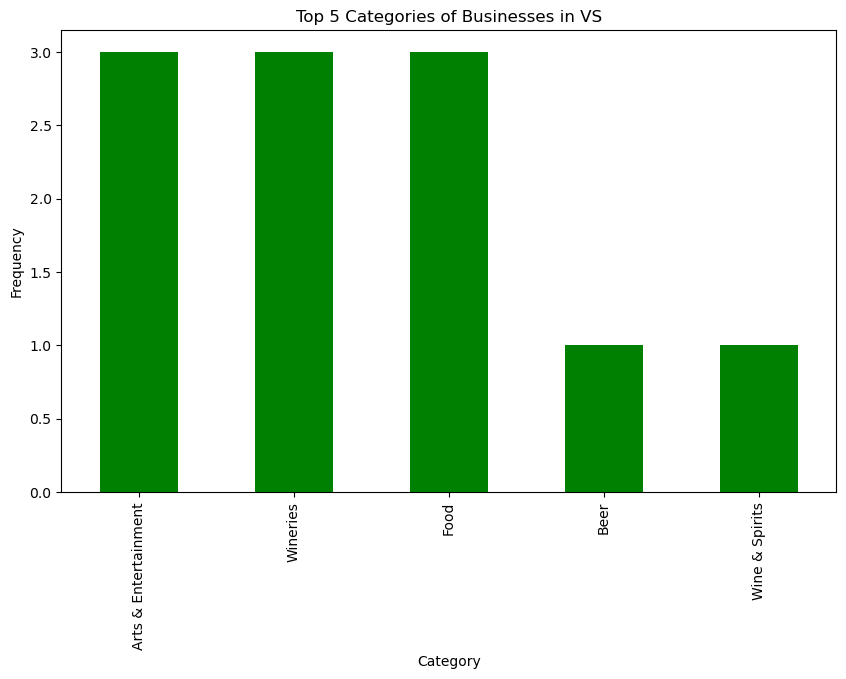

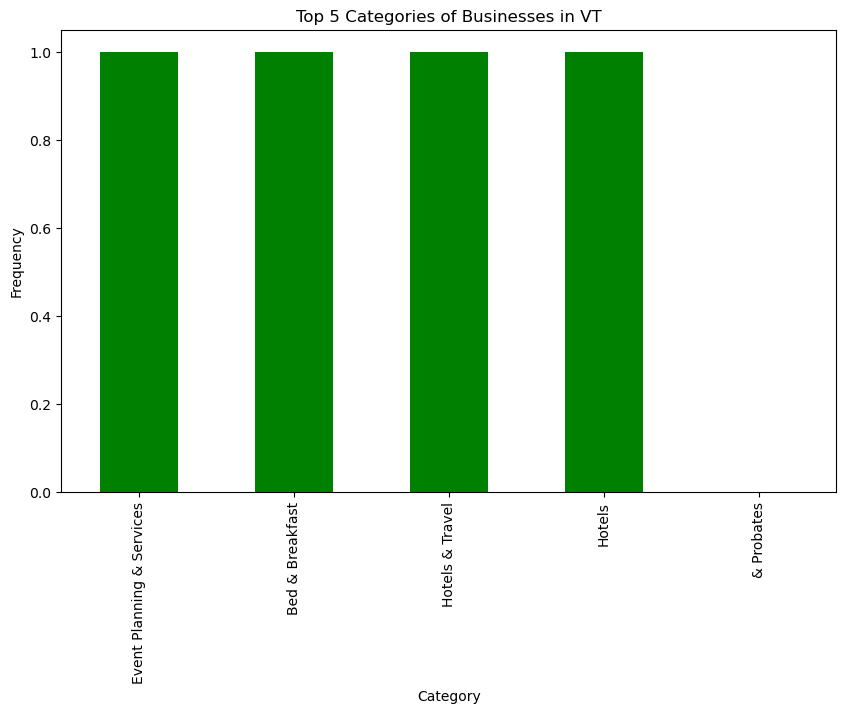

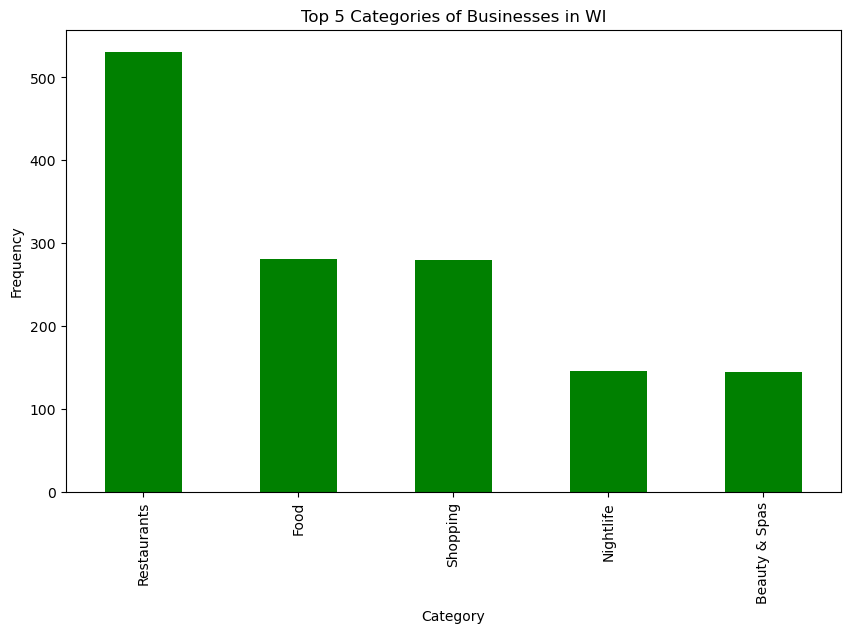

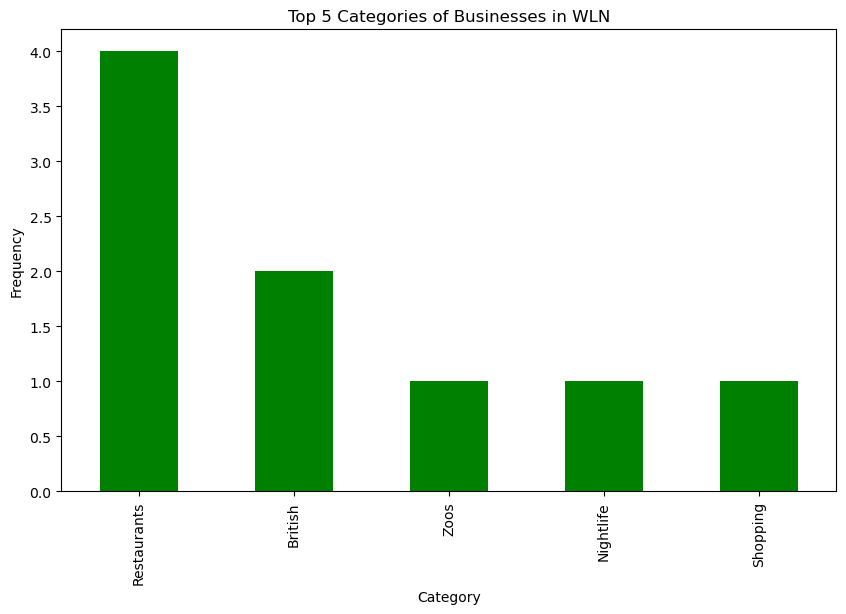

In [54]:
query = """
MATCH (b:Business)-[:is_in_city]->(ci:City)-[:in_state]->(s:State)
MATCH (b)-[:in_category]->(c:Category)
RETURN s.name AS State, c.name AS category, COUNT(b) AS frequency
ORDER BY s.name, frequency DESC
"""
result = graph.run(query).to_data_frame()

# Pivot the dataframe to create a table with states as rows and categories as columns
pivot_table = pd.pivot_table(result, values='frequency', index='State', columns='category', fill_value=0)

# Create a stacked bar chart for each state
for state in pivot_table.index:
    plt.figure(figsize=(10, 6))
    pivot_table.loc[state].sort_values(ascending=False)[:5].plot(kind='bar', stacked=True, color='green')
    plt.title(f"Top 5 Categories of Businesses in {state}")
    plt.xlabel("Category")
    plt.ylabel("Frequency")
    plt.show()

# Top 10 Business wrt Review

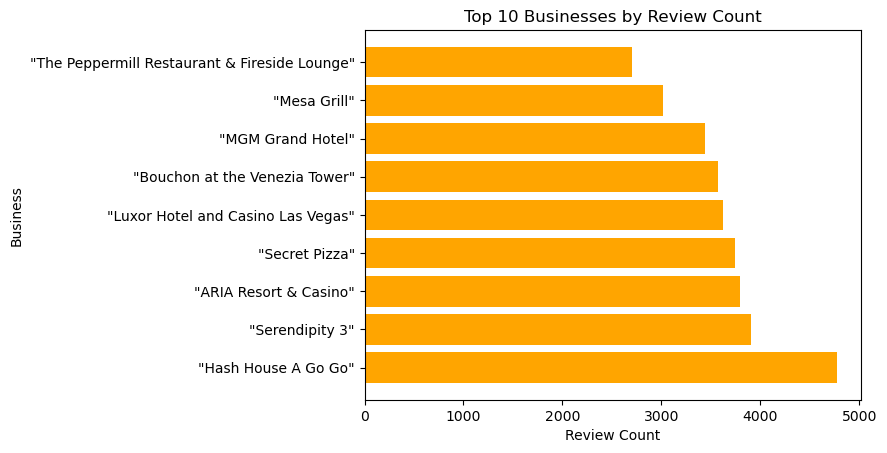

In [11]:
query = """
MATCH (b:Business)
RETURN b.name AS Business, b.review_count AS ReviewCount
ORDER BY b.review_count DESC
LIMIT 10
"""
result = graph.run(query).data()
businesses = [row['Business'] for row in result]
review_counts = [row['ReviewCount'] for row in result]

# Create a horizontal bar chart
plt.barh(businesses, review_counts, color='orange')

# Set the title and labels
plt.title('Top 10 Businesses by Review Count')
plt.xlabel('Review Count')
plt.ylabel('Business')

# Show the plot
plt.show()

# Top 10 Business wrt Rating and Review

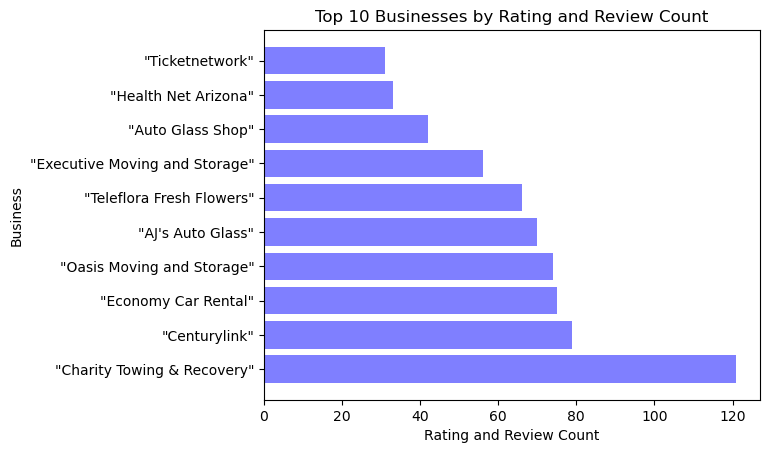

In [69]:
query = """
MATCH (b:Business)
RETURN b.name AS Business, avg(b.stars) AS AvgStarRating, avg(b.review_count) AS AvgReviewCount
ORDER BY  AvgStarRating,AvgReviewCount DESC
LIMIT 10
"""
result = graph.run(query).data()
businesses = [row['Business'] for row in result]
avg_star_ratings = [row['AvgStarRating'] for row in result]
avg_review_counts = [row['AvgReviewCount'] for row in result]

# Create a horizontal bar chart with two bars per business
fig, ax = plt.subplots()
ax.barh(businesses, avg_review_counts, label='Avg Review Count', alpha=0.5, color='blue')

# Set the title and labels
ax.set_title('Top 10 Businesses by Rating and Review Count')
ax.set_xlabel('Rating and Review Count')
ax.set_ylabel('Business')

# Show the plot
plt.show()


# Top 5 Categories in NY Based on Average Star Rating

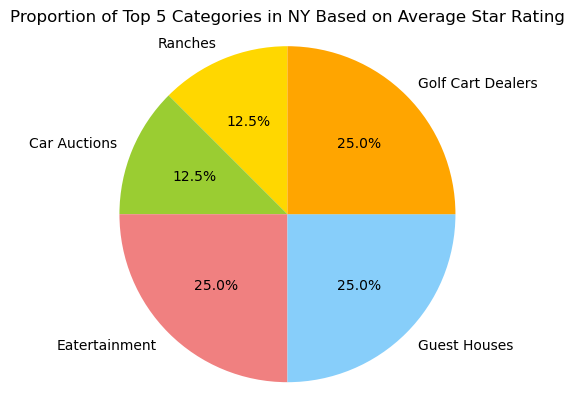

In [55]:
query = """
MATCH (b:Business)-[:in_category]->(cat:Category)
MATCH (b)-[:is_in_city]->(c:City)-[:in_state]->(s:State {name: "NY"})
RETURN cat.name AS Category, avg(b.stars) AS AvgStarRating, avg(b.review_count) AS AvgReviewCount
ORDER BY AvgStarRating,AvgReviewCount DESC
LIMIT 5
"""
result = graph.run(query).data()

categories = [record["Category"] for record in result]
ratings = [record["AvgStarRating"] for record in result]
colors = ["gold", "yellowgreen", "lightcoral", "lightskyblue", "orange"]

# Create a pie chart to show the proportion of businesses in each category
plt.pie(ratings, labels=categories, colors=colors, autopct="%1.1f%%", startangle=90)
plt.axis("equal")

# Add a title to the chart
plt.title("Proportion of Top 5 Categories in NY Based on Average Star Rating")

# Display the chart
plt.show()

# Relationship Between Review Count and Rating

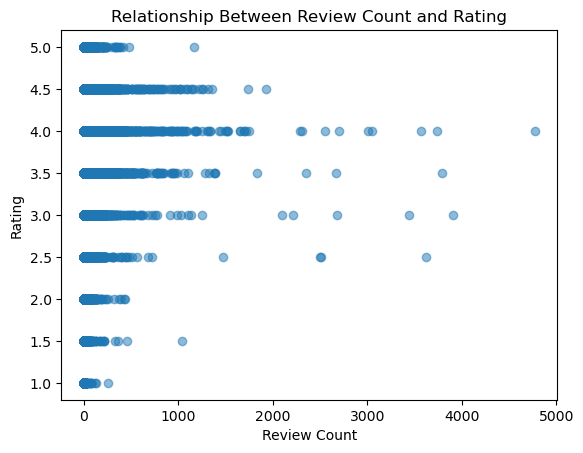

In [70]:
query = """
MATCH (b:Business)
RETURN b.name AS Business, b.review_count AS ReviewCount, b.stars AS Rating
"""
result = graph.run(query).data()
review_counts = [row['ReviewCount'] for row in result]
ratings = [row['Rating'] for row in result]

# Create the scatter plot
plt.scatter(review_counts, ratings, alpha=0.5)

# Set the title and labels
plt.title('Relationship Between Review Count and Rating')
plt.xlabel('Review Count')
plt.ylabel('Rating')

# Show the plot
plt.show()


# Average Ratings by Category and City

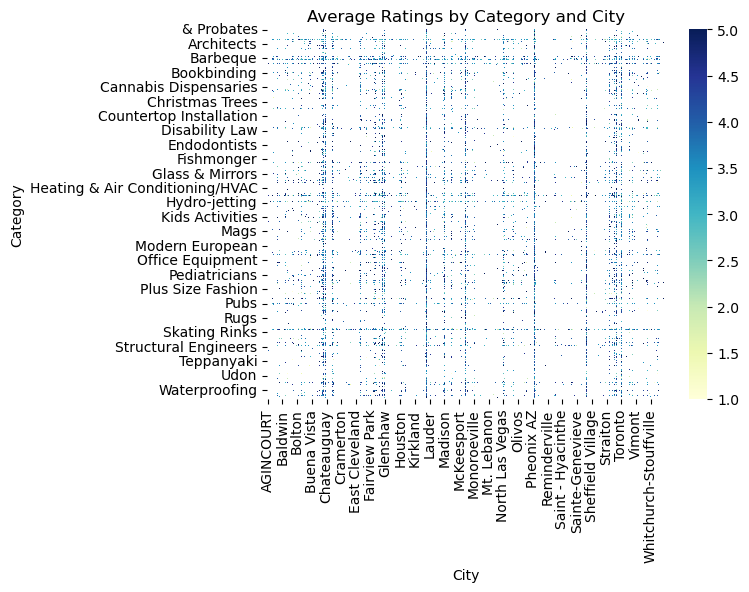

In [5]:
query = """
MATCH (b:Business)-[:in_category]->(cat:Category)
MATCH (b)-[:is_in_city]->(c:City)
RETURN c.name AS City, cat.name AS Category, AVG(b.stars) AS AvgRating
ORDER BY City, Category
"""
result = graph.run(query).data()
df = pd.DataFrame(result)

# Pivot the data to create a matrix of ratings by city and category
heatmap_data = df.pivot(index='Category', columns='City', values='AvgRating')

# Create the heat map using seaborn
sns.heatmap(heatmap_data, cmap='YlGnBu')

# Set the title and labels
plt.title('Average Ratings by Category and City')
plt.xlabel('City')
plt.ylabel('Category')

# Show the plot
plt.show()


In [12]:
# Query the graph to get the PageRank scores for each business
query = """
CALL algo.pageRank.stream('Business', 'IN_CATEGORY|IS_IN_CITY', {
  iterations: 20,
  dampingFactor: 0.85,
  write: true,
  writeProperty: 'pagerank'
})
YIELD nodeId, score
RETURN algo.getNodeById(nodeId).name AS Business, score
ORDER BY score DESC
LIMIT 10
"""
result = graph.run(query).data()

# Convert the result to a Pandas dataframe
df = pd.DataFrame(result)

# Plot the PageRank scores as a horizontal bar chart
plt.barh(df['Business'], df['score'], color='green')

# Set the title and labels
plt.title('Top 10 Most Important Businesses Based on PageRank')
plt.xlabel('PageRank Score')
plt.ylabel('Business')

# Show the plot
plt.show()


ClientError: [Procedure.ProcedureNotFound] There is no procedure with the name `algo.pageRank.stream` registered for this database instance. Please ensure you've spelled the procedure name correctly and that the procedure is properly deployed.